<a href="https://colab.research.google.com/github/shaikalthaf4/LightGlue_Motion-tracking/blob/main/LIghtGlue_dispalcement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load libraries


In [ ]:
# If we are on colab: this clones the repo and installs the dependencies
from pathlib import Path

if Path.cwd().name != "LightGlue":
    !git clone --quiet https://github.com/cvg/LightGlue/
    %cd LightGlue
    !pip install --progress-bar off --quiet -e .

# Install Interactive Features for Matplotlib
!pip install ipympl

from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
from lightglue import viz2d
import torch

import numpy as np
import cv2
from scipy import signal
import sys
from random import randint
from google.colab.patches import cv2_imshow
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from google.colab import output
output.enable_custom_widget_manager()

# Activate Widget Backend
%matplotlib widget

torch.set_grad_enabled(False)
images = Path("assets")

/content/LightGlue
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for lightglue (pyproject.toml) ... done


### Upload your video to LightGlue directory

total Frames: 5009
Frame Width: 2720
Frame Height: 1530
Frames per Second: 59.94005994005994


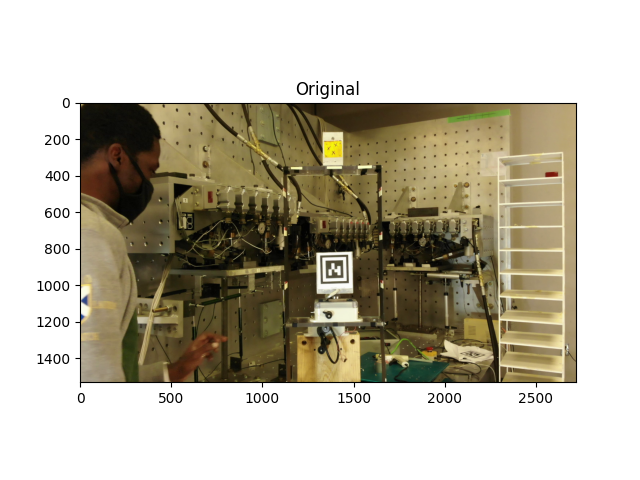

In [ ]:

cap = cv2.VideoCapture('mavic_test2.MP4')
start_frame_number = 0
cap.set(cv2.CAP_PROP_POS_FRAMES,start_frame_number)
property_id = int(cv2.CAP_PROP_FRAME_COUNT)
length = int(cv2.VideoCapture.get(cap, property_id))
print("total Frames:",length )
fps = cap.get(cv2.CAP_PROP_FPS)
# Get the width and height of the frame
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Print the FPS, width, and height
print('Frame Width:', frame_width)
print('Frame Height:', frame_height)
print('Frames per Second:', fps)

frame_end  = length
# frame_end = int(1*fps)

frame_idx = 0
f_start = int(1*fps)
cap.set(cv2.CAP_PROP_POS_FRAMES, f_start)
ret, frame = cap.read()
fig, ax = plt.subplots()
#ax.imshow(curr_frame[:,:,[2,1,0]])
# show color image
ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
plt.title('Original')
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

In [ ]:
# Rect Picker Class to get bounding box corner points of manually selected ROI
class rect_picker(object):
    def __init__(self, ax):
        self.ax = ax if ax is not None else plt.gca()
        self.rect = patches.Rectangle(xy=(0,0), width=0, height=0, ec='#ff0000', fill=False)
        self.x0 = None
        self.y0 = None
        self.x1 = None
        self.y1 = None
        self.ax.add_patch(self.rect)
        self.ax.figure.canvas.mpl_connect('button_press_event', self.on_press)
        self.ax.figure.canvas.mpl_connect('button_release_event', self.on_release)

    def on_press(self, event):
        self.x0 = event.xdata
        self.y0 = event.ydata
        self.x1 = None
        self.y1 = None

    def on_release(self, event):
        print(f"{event.xdata}, {event.ydata}")
        self.x1 = event.xdata
        self.y1 = event.ydata
        self.rect.set_xy((self.x0, self.y0))
        self.rect.set_width(self.x1 - self.x0)
        self.rect.set_height(self.y1 - self.y0)
        self.ax.figure.canvas.draw()

#### Create a figuer and draw bouding box over the ROI

##### Note: Select a larger region where you expect your target to move around during the video

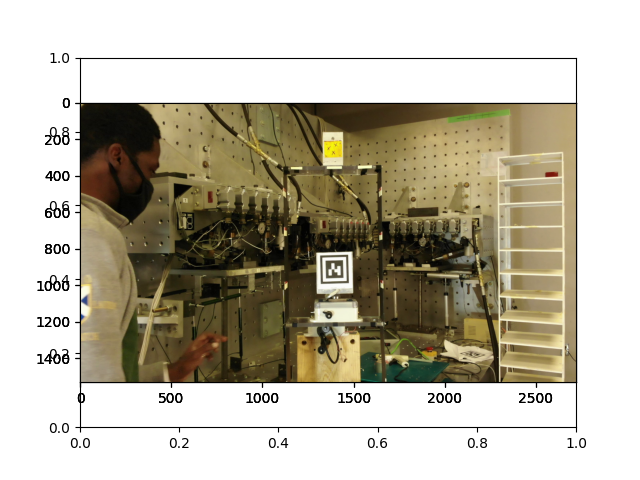

1842.1663306451612, 559.6460152902907


In [ ]:
# Create Figure and draw Bounding box
fig1 = plt.figure('Bounding Box')
ax1 = fig1.add_subplot()
# Create Rect Picker
picker = rect_picker(ax1)
# Picker Show
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# Print Pick Rect
print(f"{picker.x0}, {picker.y0}, {picker.x1-picker.x0}, {picker.y1 -picker.y0}")

964.7469758064515, 11.25891851609731, 877.4193548387098, 548.3870967741934


#### Draw and check frames [0,1] to see your selected ROI

#### Note: We are taking here the first frame as the reference frame to compute the displacement, this can be changed as needed

In [ ]:

# Video path and frame indices
video_path = 'mavic_test2.MP4'
frame_indices = [0,1]
roi = (935, 9, 928, 569)  # Replace x, y, width, height with your actual values

# Setup video capture
cap = cv2.VideoCapture(video_path)
frames = []

for frame_index in frame_indices:
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ret, frame = cap.read()
    if not ret:
        raise ValueError(f"Frame at index {frame_index} could not be read")
    # Crop to the ROI
    frame = frame[roi[1]:roi[1]+roi[3], roi[0]:roi[0]+roi[2]]
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frames.append(frame)

cap.release()

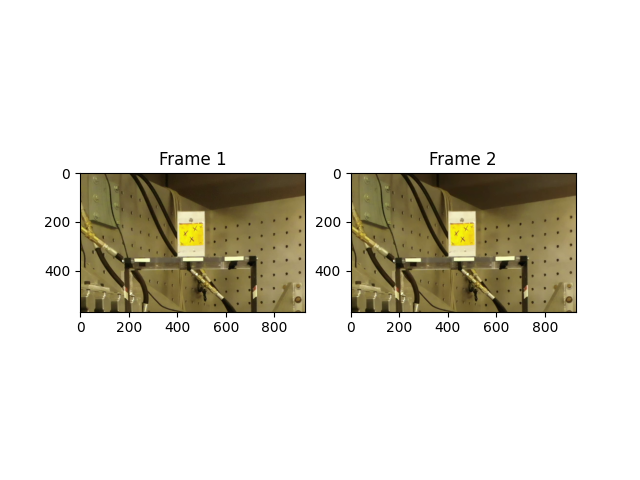

In [ ]:
# Visualize the frames

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2)

# Plot the first frame on the left
axs[0].imshow(frames[0])
axs[0].set_title("Frame 1")

# Plot the second frame on the right
axs[1].imshow(frames[1])
axs[1].set_title("Frame 2")

# Show the plot
plt.show()


### Select the feature of interest using a bounding box that needs to be tracking from Frame0

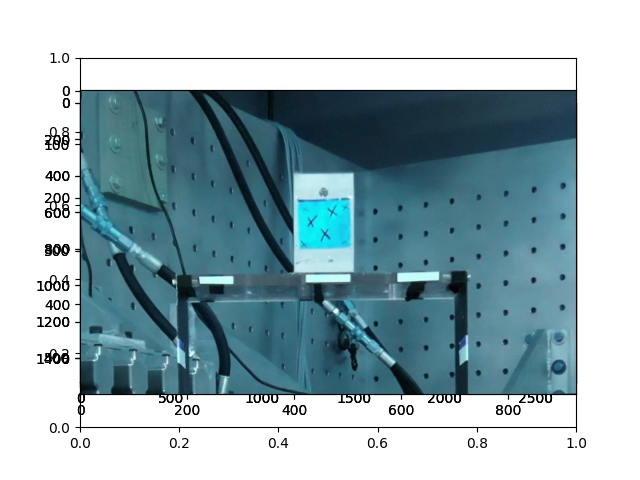

499.077620967742, 292.68928567209554


In [ ]:
# Create Figure
fig1 = plt.figure('Bounding Box')
ax1 = fig1.add_subplot()
# Create Rect Picker
picker = rect_picker(ax1)
# Picker Show
plt.imshow(cv2.cvtColor(frames[0], cv2.COLOR_BGR2RGB))
plt.show()


In [ ]:
# Print Pick Rect : bbox
print(f"{picker.x0}, {picker.y0}, {picker.x1-picker.x0}, {picker.y1 -picker.y0}")

409.2711693548387, 212.23767276886974, 89.80645161290329, 80.4516129032258


device cuda


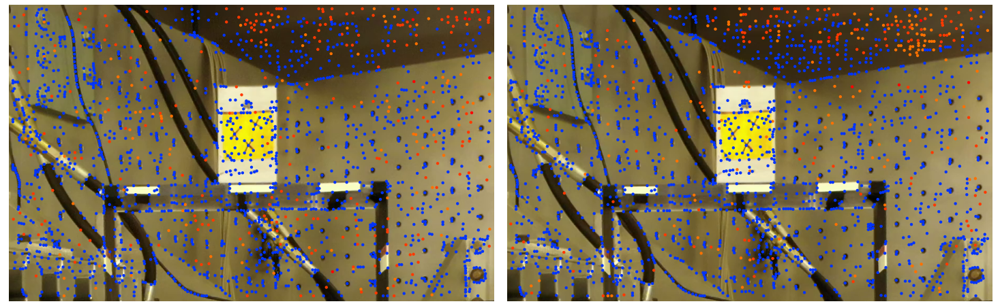

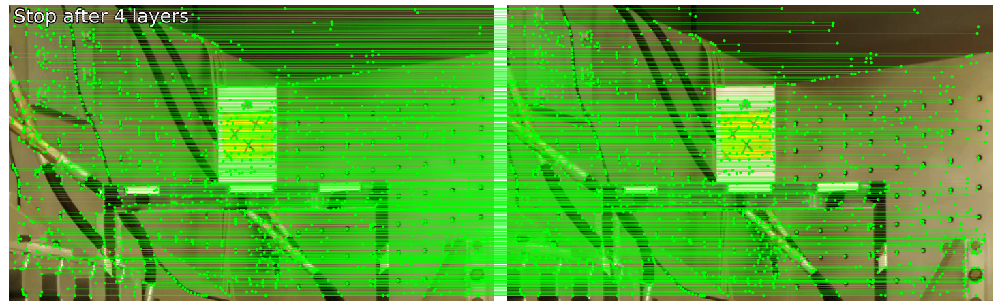

In [ ]:
# Load the model and set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device", device)
extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)
matcher = LightGlue(features="superpoint").eval().to(device)

# Convert frames to tensors and extract features
tensor_frames = [torch.from_numpy(frame).permute(2, 0, 1).float().div(255.).to(device) for frame in frames]
feats = [extractor.extract(f) for f in tensor_frames]
matches01 = matcher({"image0": feats[0], "image1": feats[1]})
feats0, feats1, matches01 = [rbd(x) for x in [feats[0], feats[1], matches01]]

# Extract keypoints and matched points
kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

# Plot the results
axes = viz2d.plot_images(frames)
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers', fs=20)

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images(frames)
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
plt.show()


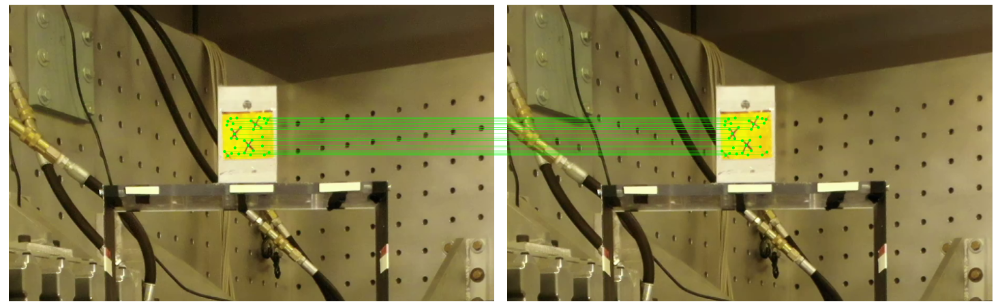

In [ ]:
# Define the bounding box [x_min, y_min, width, height]
bbox = (409, 212, 90, 80) # Replace with your bounding box coordinates

# Compute the mask for keypoints within the bounding box
inside_bbox = (m_kpts0[:, 0] >= bbox[0]) & (m_kpts0[:, 0] <= bbox[0] + bbox[2]) & \
              (m_kpts0[:, 1] >= bbox[1]) & (m_kpts0[:, 1] <= bbox[1] + bbox[3])

# Filter keypoints that are inside the bounding box
filtered_m_kpts0 = m_kpts0[inside_bbox]
filtered_m_kpts1 = m_kpts1[inside_bbox]

# Plot the original images
axes = viz2d.plot_images(frames)

# Plot matches that are only within the bounding box
viz2d.plot_matches(filtered_m_kpts0, filtered_m_kpts1, color="lime", lw=0.2)

plt.show()


In [ ]:
# Check the calculated displacements for each match
displacements = np.abs((filtered_m_kpts0.cpu()[:,0] - filtered_m_kpts1.cpu()[:,0]).mean()) # x axis
# Print displacements and mean displacement
print("Displacements (pixel units):", displacements)


Displacements (pixel units): tensor(0.0275)


## Finally, run the LIghtGLue based dispalcement tracker for your video!

Streaming output truncated to the last 5000 lines.
Y-axis Displacement: tensor(15.9114)
Frame 2464
X-axis Displacement: tensor(-11.9625)
Y-axis Displacement: tensor(15.8812)
Frame 2465
X-axis Displacement: tensor(-11.5766)
Y-axis Displacement: tensor(15.9836)
Frame 2466
X-axis Displacement: tensor(-12.0162)
Y-axis Displacement: tensor(16.2677)
Frame 2467
X-axis Displacement: tensor(-12.9788)
Y-axis Displacement: tensor(16.5618)
Frame 2468
X-axis Displacement: tensor(-14.4676)
Y-axis Displacement: tensor(16.5294)
Frame 2469
X-axis Displacement: tensor(-16.3750)
Y-axis Displacement: tensor(16.8669)
Frame 2470
X-axis Displacement: tensor(-18.8047)
Y-axis Displacement: tensor(16.8211)
Frame 2471
X-axis Displacement: tensor(-21.2530)
Y-axis Displacement: tensor(17.2132)
Frame 2472
X-axis Displacement: tensor(-24.1667)
Y-axis Displacement: tensor(17.2424)
Frame 2473
X-axis Displacement: tensor(-27.1228)
Y-axis Displacement: tensor(17.4693)
Frame 2474
X-axis Displacement: tensor(-29.9062)
Y-a

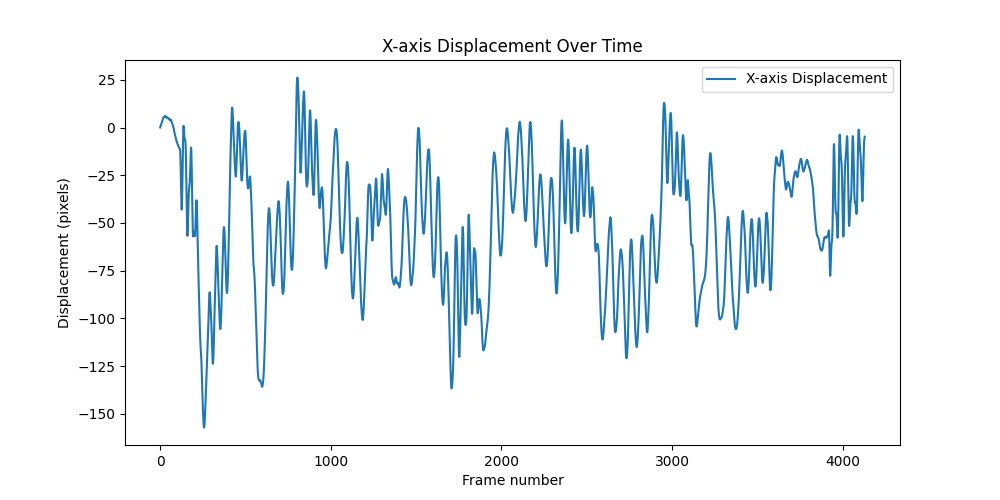

In [ ]:
# Video path
video_path = 'mavic_test2.MP4'

# Initialize video capture
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise IOError("Cannot open video")

# Define the bounding box [x_min, y_min, width, height]
bbox = (409, 212, 90, 80) # Replace with your bounding box coordinates # only the target region for tracking
roi = (935, 9, 928, 569)     # Replace x, y, width, height with your actual values # of main crop figure
see_tracking = True

###############

# Set device for computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device", device)

# Initialize the feature extractor and matcher
extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)
matcher = LightGlue(features="superpoint").eval().to(device)

# Read the first frame and prepare it
ret, first_frame = cap.read()
if not ret:
    raise ValueError("Failed to read the first frame")
first_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
first_frame = first_frame[roi[1]:roi[1]+roi[3], roi[0]:roi[0]+roi[2]]
first_frame_tensor = torch.from_numpy(first_frame).permute(2, 0, 1).float().div(255.).to(device)
# feat_first = extractor.extract(first_frame_tensor)

frame_end  = (70 * 59)
x_displacements = []
y_displacements = []
i = 0
# Process the rest of the frames
while True:
    feat_first = extractor.extract(first_frame_tensor) # everytime run extractor on frame1 too
    print("Frame", i)
    ret, frame = cap.read()
    if i == frame_end or not ret:
        break

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = frame[roi[1]:roi[1]+roi[3], roi[0]:roi[0]+roi[2]]
    frame_tensor = torch.from_numpy(frame).permute(2, 0, 1).float().div(255.).to(device)
    feat_frame = extractor.extract(frame_tensor)
    matches = matcher({"image0": feat_first, "image1": feat_frame})
    feat_first, feat_frame, matches = [rbd(x) for x in [feat_first, feat_frame, matches]]

    kpts_first, kpts_frame, matches = feat_first["keypoints"], feat_frame["keypoints"], matches["matches"]
    m_kpts_first, m_kpts_frame = kpts_first[matches[..., 0]], kpts_frame[matches[..., 1]]

    # Compute the mask for keypoints within the bounding box
    inside_bbox = (m_kpts_first[:, 0] >= bbox[0]) & (m_kpts_first[:, 0] <= bbox[0] + bbox[2]) & \
              (m_kpts_first[:, 1] >= bbox[1]) & (m_kpts_first[:, 1] <= bbox[1] + bbox[3])

    # Filter keypoints that are inside the bounding box
    filtered_m_kpts0 = m_kpts_first[inside_bbox]
    filtered_m_kpts1 = m_kpts_frame[inside_bbox]

    # Plot matches that are only within the bounding box
    if see_tracking:
      ax = viz2d.plot_images(frames)
      viz2d.plot_matches(filtered_m_kpts0, filtered_m_kpts1, color="lime", lw=0.2)
      plt.show()

    # Calculate x-axis displacements for matched keypoints
    x_displacement = (filtered_m_kpts0.cpu()[:, 0] - filtered_m_kpts1.cpu()[:, 0]).mean()
    # Calculate y axis dispalcement
    y_displacement = (filtered_m_kpts0.cpu()[:, 1] - filtered_m_kpts1.cpu()[:, 1]).mean()
    print("X-axis Displacement:", x_displacement)
    print("Y-axis Displacement:", y_displacement)

    x_displacements.append(x_displacement)
    y_displacements.append(y_displacement)

    i+=1

cap.release()

# Print or plot the x-axis displacements
plt.figure(figsize=(10, 5))
plt.plot(x_displacements, label='X-axis Displacement')
plt.xlabel('Frame number')
plt.ylabel('Displacement (pixels)')
plt.title('X-axis Displacement Over Time')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(y_displacements, label='Y-axis Displacement')
plt.xlabel('Frame number')
plt.ylabel('Displacement (pixels)')
plt.title('Y-axis Displacement Over Time')
plt.legend()
plt.show()


In [ ]:
# save displacement estimate from LightGlue
# np.save('x_disp_light_test2note10.npy', x_displacements)
# np.save('y_disp_light_test2note10.npy', y_displacements)
